## 📊 Attention & Performance Analysis of the Hierarchical Transformer

- 📈  **Evaluate model performance** by analyzing the training and cross-validation <br>
  loss across **every fold, epoch, and batch**. Additionally, examine the loss <br>
  curves during training on the **full dataset** for **every epoch and batch** <br>
  to assess convergence, training stability, and the model's ability to generalize.
- 🎯 **Assess predictive performance** using:
  - True vs. Predicted value plots
  - Bland–Altman plots
  - Residual plots
  - Q–Q plots
  - These visualizations help identify prediction errors, systematic bias, <br>
  heteroscedasticity, and deviations from the assumptions of the model.

- 🧠 **Analyze the model's attention mechanisms** by aggregating attention <br>
  weights across the dataset and visualizing them with:
  - 🔥 Attention heatmaps
  - 🕸️ Attention graphs
  - 📊 Bar charts and scatter plots for average attetion
  -  These visualizations highlight the **attention distribution** and  <br>
  provide insights into which features or input regions the Hierarchical Transformer  <br>
  focuses.

- 🔍 The performance evaluation and attention analysis uses the output data saved in the <br>
  following output directories:
  - ⚡ Energy prediction: `Deep Learning/Hierachical Transformer/Transformer_opt/model_output_energy`
  - 🔋 Power prediction: `Deep Learning/Hierachical Transformer/Transformer_opt/model_output_power`

In [ ]:
import os
import sys

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import BisectingKMeans
import plotly.colors
from scipy import stats
import statsmodels.api as sm


import torch
import networkx as nx

import pickle
from dataclasses import dataclass, field
from typing import List, Optional

# Get the current working directory. Either get injected value from globals or
# default to os.getcwd(). This enables easy testing
CWD = globals().get("CWD", os.getcwd())

# Define the path to the global utilities directory. Either get injected value
# from globals or default. This enables easy testing
GLOBAL_UTILS_DIR = globals().get(
    "GLOBAL_UTILS_DIR",
    os.path.normpath(
        os.path.join(CWD, "..", "..", "..", "Global utils_opt")
    ),
)
# Define the path to the global DL utils directory
GLOBAL_DL_UTILS_DIR = os.path.normpath(
    os.path.join(CWD, "..", "..", "..", "Global DL_utils_opt")
)


# Append this directory to the system path
sys.path.append(GLOBAL_UTILS_DIR)
sys.path.append(GLOBAL_DL_UTILS_DIR)

from global_utils import *
from loss_dataclass_plotting import *

# Enable autoreload and black formatting in Jupyter notebooks
%load_ext jupyter_black
%load_ext autoreload
%autoreload 2


# Set the random seed for reproducibility for the DataLoaders and any other random operations
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

# Create random number generators for PyTorch and NumPy to ensure reproducibility
GEN_NP = np.random.default_rng(RANDOM_SEED)

✅ Found style_sheet_matplotlib.mplstyle at: /home/raraabf1/PhD/MRI_data_analysis/Stylesheets/style_sheet_matplotlib.mplstyle
✅ Found style_sheet_plotly.json at: /home/raraabf1/PhD/MRI_data_analysis/Stylesheets/style_sheet_plotly.json


## 📉 Loss and Performance of the Model

- The performance of the Hierachical Transformer is evaluated by analyzing <br>
the training loss.
- 📉 The model is trained using the standard **Mean Absolute Error (MAE)** loss function.
- ⚡ Two separate models are trained:
  - 🔋 One model predicts **Energy**
  - ⚙️ One model predicts **Power**

---

- The loss values are stored inside a dedicated **loss manager class**, which <br>
  is initialized and then populated from the saved pickle file.
- For **cross-validation**, the loss is tracked at three levels:
  - 🪜 Fold
  - 📈 Epoch
  - 📦 Batch
- Each fold contains one validation epoch, and the corresponding losses are <br>
  visualized separately.
---

- In addition, the model is trained on the **full dataset** to produce coherent <br>
  embeddings.
- No validation is used in this setting.
- For the full-data run, the loss is visualized at the:
  - 📈 Epoch level
  - 📊 Batch level


In [3]:
# Define the path to the saved datasets
DATA_DIR_ENERGY = os.path.normpath(
    os.path.join(CWD, "..", "Transformer_opt", "model_output_energy")
)
DATA_DIR_POWER = os.path.normpath(
    os.path.join(CWD, "..", "Transformer_opt", "model_output_power")
)

# Load the loss manager from the saved pickle file to access saved values of
# the losses during training and validation
loss_manager_energy = pickle.load(
    open(DATA_DIR_ENERGY + "/loss_manager_energy.pkl", "rb")
)
loss_manager_power = pickle.load(open(DATA_DIR_POWER + "/loss_manager_power.pkl", "rb"))

In [ ]:
# Plot the loss of the transformer model for energy prediction using cross-validation and fold aggregation
plot_loss(
    loss_manager_energy,
    training_type="CV",
    agg_type="Fold",
    save_fig="CV_loss_per_fold_energy",
)

In [ ]:
# Plot the loss of the transformer model for power prediction using cross-validation and fold aggregation
plot_loss(
    loss_manager_power,
    training_type="CV",
    agg_type="Fold",
    save_fig="CV_loss_per_fold_power",
)

In [ ]:
# Plot the loss of the transformer model for power prediction using cross-validation and epoch aggregation
plot_loss(loss_manager_energy, training_type="CV", agg_type="Epoch")

In [ ]:
# Plot the loss of the transformer model for power prediction using cross-validation and epoch aggregation
plot_loss(loss_manager_power, training_type="CV", agg_type="Epoch")

In [ ]:
# Plot the loss of the transformer model for energy prediction using full data training and epoch aggregation
plot_loss(loss_manager_energy, training_type="Full Data", agg_type="Epoch")

In [ ]:
# Plot the loss of the transformer model for energy prediction using full data training and epoch aggregation
plot_loss(loss_manager_power, training_type="Full Data", agg_type="Epoch")

In [ ]:
# Plot the loss of the transformer model for energy prediction using full data training and epoch aggregation
# plot_loss(
#    loss_manager_energy,
#    training_type="CV",
#    agg_type="Batch",
#    # save_fig="CV_loss_per_batch_energy",
#    lines_markers="lines",
# )

In [ ]:
# Plot the loss of the transformer model for power prediction using full data training and epoch aggregation
# plot_loss(
#    loss_manager_power,
#    training_type="CV",
#    agg_type="Batch",
#    #save_fig="CV_loss_per_batch_power",
#    lines_markers="lines",
# )

In [ ]:
# Plot the loss of the transformer model for energy prediction using full data training and batch aggregation
plot_loss(
    loss_manager_energy,
    training_type="Full Data",
    agg_type="Batch",
    save_fig="full_data_training_loss_per_batch_energy",
    lines_markers="lines",
)

In [ ]:
# Plot the loss of the transformer model for power prediction using full data training and batch aggregation
plot_loss(
    loss_manager_power,
    training_type="Full Data",
    agg_type="Batch",
    save_fig="full_data_training_loss_per_batch_power",
    lines_markers="lines",
)

## 📈 Performance Analysis

- 🎯 Evaluate the model's predictions against the ground truth using <br>
   **scatter plots** and **line plots** to assess prediction accuracy and error <br>
   distribution.
- 🔄 Generate a **Ground Truth vs. Predicted** plot to directly compare the model's  <br>
  predictions with the true target values and visually assess prediction accuracy.
- ⚖️ Generate a **Bland–Altman plot** to evaluate the agreement between predicted <br>
  and true values.
- 📊 Create a **Residuals vs. Predicted** plot to assess error patterns, <br>
  detect heteroscedasticity, and identify potential model biases.
- 📐 Generate a **Q–Q (Quantile–Quantile) plot** to evaluate whether the <br>
  residuals follow a normal distribution.
- 📏 Calculate the regression performance metrics, including:
  - **Mean Absolute Error (MAE)**
  - **Mean Squared Error (MSE)**
  - **Root Mean Squared Error (RMSE)**
  - **Coefficient of Determination (R²)**
  - **Pearson Correlation Coefficient (r)**

In [4]:
# Load the loss manager from the saved pickle file to access saved values of
# the losses during training and validation
TARGETS_PREDICTIONS_ENERGY = pickle.load(
    open(DATA_DIR_ENERGY + "/targets_predictions_energy.pkl", "rb")
)
TARGETS_PREDICTIONS_POWER = pickle.load(
    open(DATA_DIR_POWER + "/targets_predictions_power.pkl", "rb")
)

print(f"Shape of TARGETS_PREDICTIONS_ENERGY: {TARGETS_PREDICTIONS_ENERGY.shape}")
print(f"Shape of TARGETS_PREDICTIONS_POWER: {TARGETS_PREDICTIONS_POWER.shape}")

Shape of TARGETS_PREDICTIONS_ENERGY: (599532, 3)
Shape of TARGETS_PREDICTIONS_POWER: (599532, 3)


In [5]:
def evaluate_and_plot_transformer(
    targets_predictions: pd.DataFrame,
    n_samples: int = 1000,
    mode: str = "energy",
    save_fig: str = None,
):
    """
    Evaluates the Transformer model on the test dataset.

    - Computes and prints the average loss over the test set.
    - Randomly samples predictions and true values for and visualizes
        predicted vs. true values and error metrics.
    - Fits a linear regression model to the sampled data and displays the
        regression line and confidence intervals.
    - Prints regression parameters including slope, intercept, and R².

    Parameters:
        - targets_predictions (pd.DataFrame): DataFrame containing predictions and targets.
        - n_samples (int): Number of random samples to visualize (default: 1000).
        - mode (str): Mode of evaluation, either "energy" or "power" (default: "energy").
        - save_fig (str): If provided, saves the figure to the specified path (default: None).
    """
    # Initalize the radom seed
    rng = np.random.default_rng(RANDOM_SEED)
    # Select units based on the mode
    units_select = {"energy": "kWh", "power": "kW"}
    units = units_select.get(mode, "units")

    # Get the predictions and targets from the attention_predictions_mappings
    predictions = targets_predictions["predictions"]
    targets = targets_predictions["targets"]

    # Calculate the overall mean absolute difference, mean sqaurred difference
    #  and percentage difference
    mean_diff = np.mean(np.abs(predictions - targets))
    mean_sq_diff = np.mean((predictions - targets) ** 2)
    mean_perc_diff = np.mean(np.abs((predictions / targets) - 1) * 100)
    mean_rsme = np.sqrt(mean_sq_diff)

    print(f"Mean absolute difference: {mean_diff:.4f}")
    print(f"Mean squared difference: {mean_sq_diff:.4f}")
    print(f"Mean percentage difference: {mean_perc_diff:.4f}%")
    print(f"Mean root mean squared error: {mean_rsme:.4f}")

    # Sample some predictions and targets
    num_samples = predictions.shape[0]

    n_samples = min(n_samples, num_samples)
    idx_random = rng.choice(num_samples, n_samples, replace=False)
    sampled_preds = predictions[idx_random]
    sampled_targets = targets[idx_random]

    # Fit linear regression
    X = sm.add_constant(sampled_targets)
    model = sm.OLS(sampled_preds, X).fit()
    slope = model.params.iloc[1]
    intercept = model.params.iloc[0]
    r2 = model.rsquared

    # Predict regression line and CI
    x_pred = np.linspace(sampled_targets.min(), sampled_targets.max(), 100)
    X_pred = sm.add_constant(x_pred)
    y_pred = model.predict(X_pred)
    predictions = model.get_prediction(X_pred)
    ci = predictions.conf_int(alpha=0.05)
    ci_lower = ci[:, 0]
    ci_upper = ci[:, 1]

    fig = go.Figure()
    fig.add_trace(
        go.Scatter(
            x=sampled_targets,
            y=sampled_preds,
            mode="markers",
            name="Predictions" + "   ",
            marker=dict(color="blue", opacity=0.75, size=5),
            hovertemplate=f"True Value: %{{x}} [{units}]<br>Predicted Value: %{{y}} [{units}]<extra></extra>",
        )
    )

    # Add regression line
    fig.add_trace(
        go.Scatter(
            x=x_pred,
            y=y_pred,
            mode="lines",
            name="Regression" + "   ",
            line=dict(color="red", dash="dot"),
        )
    )

    # Add confidence interval as filled area
    fig.add_trace(
        go.Scatter(
            x=np.concatenate([x_pred, x_pred[::-1]]),
            y=np.concatenate([ci_upper, ci_lower[::-1]]),
            fill="toself",
            fillcolor="rgba(255,0,0,0.3)",
            line=dict(color="rgba(255,0,0,0)"),
            hoverinfo="skip",
            showlegend=True,
            name="95% CI" + "   ",
        )
    )

    # Print regression values
    print(f"Regression: y = {slope:.3f}x + {intercept:.3f} (R² = {r2:.3f})")
    # Print the 95% confidence interval for the regression line
    print(f"95% Confidence Interval: [{ci_lower[0]:.3f}, {ci_upper[0]:.3f}]")

    fig.update_layout(
        # title=f"Predicted vs. True {mode.capitalize()} Consumption<br>with Regression Line",
        xaxis_title=f"True {mode.capitalize()} Consumption [{units}]",
        yaxis_title=f"Predicted {mode.capitalize()} Consumption [{units}]",
        # legend_title="Type",
        showlegend=True,
    )

    # Save the figure if a filename is provided
    if save_fig:
        save_fig_formats(fig, save_fig)

    return fig


# Plot and evaalute the transformer's prediction for the energy dataset using the
# targets and predictions from the saved pickle file
evaluate_and_plot_transformer(
    TARGETS_PREDICTIONS_ENERGY,
    n_samples=5000,
    mode="energy",
    save_fig="predicted_vs_true_energy_consumption",
)

Mean absolute difference: 0.0975
Mean squared difference: 0.3771
Mean percentage difference: 370.9570%
Mean root mean squared error: 0.6141
Regression: y = 0.907x + 0.072 (R² = 0.963)
95% Confidence Interval: [0.070, 0.079]


In [6]:
# Plot and evaalute the transformer's prediction for the power dataset using the
# targets and predictions from the saved pickle file
evaluate_and_plot_transformer(
    TARGETS_PREDICTIONS_POWER,
    n_samples=5000,
    mode="power",
    save_fig="predicted_vs_true_power_consumption",
)

Mean absolute difference: 1.9540
Mean squared difference: 14.4615
Mean percentage difference: 8.5154%
Mean root mean squared error: 3.8028
Regression: y = 0.781x + 4.844 (R² = 0.843)
95% Confidence Interval: [9.935, 10.282]


In [7]:
def bland_altman_plot(
    targets_predictions: pd.DataFrame,
    target_column="targets",
    prediction_column="predictions",
    n_samples: int = 1000,
    mode: str = "energy",
    save_fig: str = None,
) -> go.Figure:
    """
    Create a Bland-Altman plot to compare the predictions and true values
    from the transformer model.

    Parameters:
        - targets_predictions (pd.DataFrame): DataFrame containing predictions and targets
        - target_column (str): The column name for the true values
        - prediction_column (str): The column name for the predictions
        - n_samples (int): Number of samples to use for the plot
        - mode (str): The mode of the plot, either "energy" or "power"
        - save_fig (str or None): filename to save the figure or None to not save

    Returns:
        - fig: Plotly figure object
    """

    # Initalize the radom seed
    rng = np.random.default_rng(RANDOM_SEED)

    # Select units based on the mode
    units_select = {"energy": "kWh", "power": "kW"}
    units = units_select.get(mode, "units")

    # Extract true values and predictions from the mappings
    targets = targets_predictions[target_column]
    predictions = targets_predictions[prediction_column]

    # Randomly sample the data
    num_samples = predictions.shape[0]

    n_samples = min(n_samples, num_samples)
    idx_random = rng.choice(num_samples, n_samples, replace=False)
    sampled_preds = predictions[idx_random]
    sampled_targets = targets[idx_random]

    # Calculate means and differences
    means = (sampled_targets + sampled_preds) / 2
    differences = sampled_preds - sampled_targets

    # Calculate mean and standard deviation of differences
    mean_diff = np.mean(differences)
    std_diff = np.std(differences)

    # Create the Bland-Altman plot
    fig = go.Figure()
    fig.add_trace(
        go.Scatter(
            x=means,
            y=differences,
            mode="markers",
            name="Differences" + "     ",
            marker=dict(color="blue", opacity=0.8, size=3),
            hovertemplate=f"Mean: %{{x:.2f}} [{units}]<br>Difference: %{{y:.2f}} [{units}]<extra></extra>",
        )
    )

    # Add mean difference line
    fig.add_trace(
        go.Scatter(
            x=[min(means), max(means)],
            y=[mean_diff, mean_diff],
            mode="lines",
            name="Mean Difference" + "     ",
            line=dict(color="red", dash="dash"),
            hovertemplate=f"Mean Difference: %{{y:.2f}} [{units}]",
        )
    )

    # Add limits of agreement lines
    fig.add_trace(
        go.Scatter(
            x=[min(means), max(means)],
            y=[mean_diff + 1.96 * std_diff, mean_diff + 1.96 * std_diff],
            mode="lines",
            name="Upper Limit of Agreement" + "     ",
            line=dict(color="green", dash="dot"),
            hovertemplate=f"Upper Limit of Agreement: %{{y:.2f}} [{units}]",
        )
    )

    fig.add_trace(
        go.Scatter(
            x=[min(means), max(means)],
            y=[mean_diff - 1.96 * std_diff, mean_diff - 1.96 * std_diff],
            mode="lines",
            name="Lower Limit of Agreement" + "     ",
            line=dict(color="green", dash="dot"),
            hovertemplate=f"Lower Limit of Agreement: %{{y:.2f}} [{units}]",
        )
    )

    # Update layout
    fig.update_layout(
        # title=f"Bland-Altman Agreement Plot for<br>{mode.capitalize()} Consumption Predictions",
        xaxis_title=f"Mean of True and Predicted {mode.capitalize()} Consumption [{units}]",
        yaxis_title=f"Difference between Predicted<br>and True {mode.capitalize()} Consumption [{units}]",
        # legend_title="Type",
    )

    # Save the figure if a filename is provided
    if save_fig:
        save_fig_formats(fig, save_fig)

    return fig


# Create a Bland-Altman plot for the transformer energy dataset using the targets
# and predictions from the saved pickle file
bland_altman_plot(
    targets_predictions=TARGETS_PREDICTIONS_ENERGY,
    n_samples=5000,
    mode="energy",
    save_fig="bland_altman_plot_energy",
)

In [8]:
# Create a Bland-Altman plot for the transformer power dataset using the targets
# and predictions from the saved pickle file
bland_altman_plot(
    targets_predictions=TARGETS_PREDICTIONS_POWER,
    n_samples=5000,
    mode="power",
    save_fig="bland_altman_plot_power",
)

In [ ]:
def residual_vs_predicted_plot(
    targets_predictions: pd.DataFrame,
    n_samples: int = 1000,
    mode: str = "energy",
    save_fig: str = None,
) -> go.Figure:
    """
    Create a residual vs predicted plot to assess the performance of the transformer model.

    Parameters:
        - targets_predictions: pd.DataFrame, DataFrame containing predictions and targets
        - n_samples: int, number of samples to use for the plot
        - mode: str, the mode for the plot
        - save_fig: str or None, filename to save the figure or None to not save

    Returns:
        - fig: Plotly figure object
    """

    # Initalize the radom seed
    rng = np.random.default_rng(RANDOM_SEED)

    # Extract true values and predictions from the mappings
    targets = targets_predictions["targets"]
    predictions = targets_predictions["predictions"]

    # Randomly sample the data
    num_samples = predictions.shape[0]

    n_samples = min(n_samples, num_samples)
    idx_random = rng.choice(num_samples, n_samples, replace=False)
    sampled_preds = predictions[idx_random]
    sampled_targets = targets[idx_random]
    residuals = sampled_targets - sampled_preds

    # Create the residual vs predicted plot
    fig = go.Figure()
    fig.add_trace(
        go.Scatter(
            x=sampled_preds,
            y=residuals,
            mode="markers",
            name="Residuals" + "   ",
            marker=dict(color="blue", opacity=0.8, size=5),
        )
    )

    # Add a horizontal line at y=0
    fig.add_trace(
        go.Scatter(
            x=[min(sampled_preds), max(sampled_preds)],
            y=[0, 0],
            mode="lines",
            name="Zero Line" + "   ",
            line=dict(color="red", dash="dash"),
        )
    )

    # Update layout
    fig.update_layout(
        # title=f"Residuals vs Predicted for <br>{mode.capitalize()} Consumption Predictions",
        xaxis_title=f"Predicted {mode.capitalize()} Consumption",
        yaxis_title=f"Residuals (True - Predicted {mode.capitalize()})",
        legend_title="Type",
    )

    # Save the figure if a filename is provided
    if save_fig:
        save_fig_formats(fig, save_fig)

    return fig


# Plot the residual vs predicted plot for the transformer energy dataset using the
# targets and predictions from the saved pickle file
residual_vs_predicted_plot(
    targets_predictions=TARGETS_PREDICTIONS_ENERGY,
    n_samples=5000,
    mode="energy",
    save_fig="residual_vs_predicted_plot_energy",
)

In [ ]:
# Plot the residual vs predicted plot for the transformer power dataset using the
# targets and predictions from the saved pickle file
residual_vs_predicted_plot(
    targets_predictions=TARGETS_PREDICTIONS_POWER,
    n_samples=5000,
    mode="power",
    save_fig="residual_vs_predicted_plot_power",
)

In [ ]:
def qq_plot_residuals(
    targets_predictions: pd.DataFrame,
    n_samples: int = 5000,
    mode: str = "energy",
    save_fig: str = None,
) -> go.Figure:
    """
    Create a Q-Q plot of the residuals to assess the normality of the residuals
    from the transformer model.

    Parameters:
        - targets_predictions  (pd.DataFrame): DataFrame containing predictions and targets
        - n_samples (int): Number of samples to use for the plot
        - mode (str): The mode for the plot, either "energy" or "power"
        - save_fig (str or None): filename to save the figure or None to not save

    Returns:
        - fig: Plotly figure object
    """
    # Initalize the radom seed
    rng = np.random.default_rng(RANDOM_SEED)

    # Get the predictions and targets from the attention_predictions_mappings
    targets = targets_predictions["targets"].to_numpy()
    predictions = targets_predictions["predictions"].to_numpy()

    # Randomly sample the data
    num_samples = len(targets)
    n_samples = min(n_samples, num_samples)
    idx = rng.choice(num_samples, n_samples, replace=False)

    # Calculat ethe residuals
    residuals = targets[idx] - predictions[idx]

    # Compute Q-Q data
    (theoretical_q, sample_q), (slope, intercept, r) = stats.probplot(
        residuals,
        dist="norm",
        fit=True,
    )

    fig = go.Figure()

    # Sample quantiles
    fig.add_trace(
        go.Scatter(
            x=theoretical_q,
            y=sample_q,
            mode="markers",
            name="Residuals" + "   ",
            marker=dict(color="blue", opacity=0.8, size=5),
        )
    )

    # Reference line
    fig.add_trace(
        go.Scatter(
            x=theoretical_q,
            y=slope * theoretical_q + intercept,
            mode="lines",
            name="Reference line" + "   ",
            line=dict(color="red", dash="dash"),
        )
    )

    fig.update_layout(
        # title=f"Q-Q Plot of the <br>{mode.capitalize()} Consumption Residuals",
        xaxis_title="Theoretical Normal Quantiles",
        yaxis_title="Residual Quantiles",
        legend_title="Type",
        showlegend=True,
        height=600,
        width=800,
    )

    if save_fig:
        save_fig_formats(fig, save_fig)

    return fig


# Plot the Q-Q plot of the residuals for the transformer energy dataset using the
# targets and predictions from the saved pickle file
qq_plot_residuals(
    targets_predictions=TARGETS_PREDICTIONS_ENERGY,
    n_samples=5000,
    mode="energy",
    # save_fig="qq_plot_residuals_energy",
)

In [ ]:
# Plot the Q-Q plot of the residuals for the transformer power dataset using the
# targets and predictions from the saved pickle file
qq_plot_residuals(
    targets_predictions=TARGETS_PREDICTIONS_POWER,
    n_samples=5000,
    mode="power",
    # save_fig="qq_plot_residuals_power",
)

## 🔍 Attention Analysis

- 📂 Load the **aggregated attention weights** from the final training epoch of <br>
  the model trained on the full dataset.
  - The attention tensors are stored as:
    - `average_attention_full_training_energy`
    - `average_attention_full_training_power`

- 🧮 Compute the attention values for each attention type:
  - 🔢 **Numerical Self-Attention**
  - 🔤 **Categorical/Text Self-Attention**
  - 🔄 **Numerical → Categorical/Text Cross-Attention**
  - 🔄 **Categorical/Text → Numerical Cross-Attention**
  - 🔄 **Decoder Self-Attention**

- 🔑 Retrieve the corresponding **query** and **key** features, together with <br>
   their sequence indices from the dataset mappings.
  - Examples include:
    - `dataset_numerical_mappings_energy`
    - `dataset_numerical_mappings_power`
    - ...

- 🗺️ Map the attention weights from sequence positions back to their original <br>
input features using the extracted indices.
- 📊 Merge the self-attention and cross-attention matrices into a single <br>
  **total attention matrix**, capturing interactions between all numerical and <br>
  categorical/text features across the entire model.

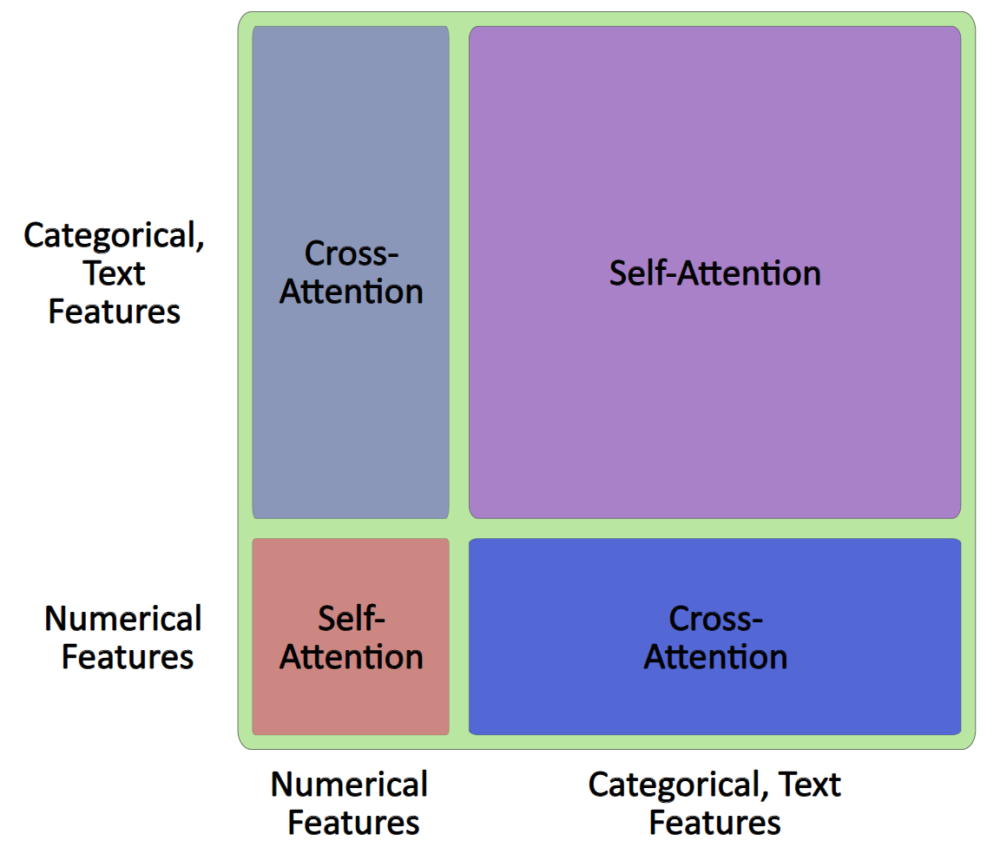

In [ ]:
def load_torch_saved_object(save_path: str, file_name: str) -> dict:
    """
    Load the attention_predictions_mappings from the specified path and file name.

    Parameters:
        - save_path (str): The path to the directory containing the file.
        - file_name (str): The name of the file to load.

    Returns:
        - dict: The loaded attention_predictions_mappings.
    """

    # Check if the save_path exists
    if not os.path.exists(save_path):
        raise FileNotFoundError(f"The specified path {save_path} does not exist.")

    # Check if the file exists in the save_path
    file_path = os.path.join(save_path, file_name)
    if not os.path.isfile(file_path):
        raise FileNotFoundError(
            f"The specified file {file_name} does not exist in the path {save_path}."
        )

    # Load the attention_predictions_mappings using torch
    torch_saved_object = torch.load(file_path, weights_only=False, map_location="cpu")

    return torch_saved_object


ATTENTION_ENERGY = load_torch_saved_object(
    DATA_DIR_ENERGY, "average_attention_full_training_energy.pt"
)

ATTENTION_POWER = load_torch_saved_object(
    DATA_DIR_POWER, "average_attention_full_training_power.pt"
)

In [ ]:
# Load in the dataset_numerical_mappings for energy and power from the saved pickle files
DATASET_NUMERICAL_MAPPINGS_ENERGY = load_torch_saved_object(
    DATA_DIR_ENERGY, "dataset_numerical_mappings_energy.pt"
)
DATASET_NUMERICAL_MAPPINGS_POWER = load_torch_saved_object(
    DATA_DIR_POWER, "dataset_numerical_mappings_power.pt"
)

# Load in the dataset_categorical_mappings for energy and power from the saved pickle files
DATASET_CATEGORICAL_MAPPINGS_ENERGY = load_torch_saved_object(
    DATA_DIR_ENERGY, "dataset_categorical_mappings_energy.pt"
)
DATASET_CATEGORICAL_MAPPINGS_POWER = load_torch_saved_object(
    DATA_DIR_POWER, "dataset_categorical_mappings_power.pt"
)

# Load in the dataset_text_mappings for energy and power from the saved pickle files
DATASET_TEXT_MAPPINGS_ENERGY = load_torch_saved_object(
    DATA_DIR_ENERGY, "dataset_text_mappings_energy.pt"
)
DATASET_TEXT_MAPPINGS_POWER = load_torch_saved_object(
    DATA_DIR_POWER, "dataset_text_mappings_power.pt"
)

In [ ]:
def _get_merged_mappings(
    attention_type_select: str,
    dataset_numerical_mappings: dict = None,
    dataset_categorical_mappings: dict = None,
    dataset_text_mappings: dict = None,
) -> dict:
    """
    Merge the numerical, categorical, and text mappings into a single dictionary
    and adapt the start and end indices to be consecutive for the selected attention type.

    Parameters:
        - attention_type_select: A string indicating the type of attention to be used.
        - dataset_numerical_mappings: A dictionary containing numerical mappings.
        - dataset_categorical_mappings: A dictionary containing categorical mappings.
        - dataset_text_mappings: A dictionary containing text mappings.

    Returns:
        - A dictionary containing the merged mappings for the query and key, with adjusted
          start and end indices to be consecutive.

    """

    # Define the attention type mappings for different attention types
    attention_type_mappings_dict = {
        "encoder_num_self_attention": {
            "query": [dataset_numerical_mappings],
            "key": [dataset_numerical_mappings],
        },
        "encoder_num_cross_attention": {
            "query": [dataset_numerical_mappings],
            "key": [dataset_text_mappings, dataset_categorical_mappings],
        },
        "encoder_text_cat_self_attention": {
            "query": [dataset_text_mappings, dataset_categorical_mappings],
            "key": [dataset_text_mappings, dataset_categorical_mappings],
        },
        "encoder_text_cat_cross_attention": {
            "query": [dataset_text_mappings, dataset_categorical_mappings],
            "key": [dataset_numerical_mappings],
        },
        "decoder_self_attention": {
            "query": [
                dataset_numerical_mappings,
                dataset_text_mappings,
                dataset_categorical_mappings,
            ],
            "key": [
                dataset_numerical_mappings,
                dataset_text_mappings,
                dataset_categorical_mappings,
            ],
        },
    }

    # Get the mappings for the selected attention type
    attention_type_mappings = attention_type_mappings_dict.get(
        attention_type_select, None
    )

    # Ensure that the attention type mappings are valid
    if attention_type_mappings is None:
        raise ValueError(
            f"Invalid attention type: {attention_type_select}. Please choose a valid attention type."
        )

    def _merge_mappings(attention_type_mappings, query_or_key: str) -> dict:
        """
        Merge and adapt the start and end indices of the mappings for the specified
        query or key.

        Parameters:
            - attention_type_mappings: A dictionary containing the mappings for the selected attention type.
            - query_or_key: A string indicating whether to merge the 'query' or 'key' mappings.

        Returns:
            - A dictionary containing the merged mappings for the specified query or key, with adjusted
              start and end indices to be consecutive.
        """

        # Initailize merged dictionary and last index tracker
        merged = {}
        last_index = 0

        # Iterate over each mapping key in the sequence mappings
        for attention_type_mapping in attention_type_mappings[query_or_key]:

            # Iterate over the key-value pairs in the current attention type mapping
            for key, value in attention_type_mapping.items():

                # Get the start and end indices
                start_idx = value["start_idx"]
                end_idx = value["end_idx"]
                # Adjust indices to be consecutive and store in merged dictionary
                merged[key] = {
                    "start_idx": start_idx + last_index,
                    "end_idx": end_idx + last_index,
                }

            # Get the end index of the last mapping in the current attention type mapping
            last_index = end_idx + last_index
        return merged

    # Merge mappings for query and key
    merged_query_feature_names_mappings = _merge_mappings(
        attention_type_mappings, "query"
    )
    merged_key_feature_names_mappings = _merge_mappings(attention_type_mappings, "key")

    return {
        "query": merged_query_feature_names_mappings,
        "key": merged_key_feature_names_mappings,
    }


# Get the merged mappings for the different attention types for the energy
MERGED_MAPPINGS_DECODER_SELF_ENERGY = _get_merged_mappings(
    attention_type_select="decoder_self_attention",
    dataset_numerical_mappings=DATASET_NUMERICAL_MAPPINGS_ENERGY,
    dataset_categorical_mappings=DATASET_CATEGORICAL_MAPPINGS_ENERGY,
    dataset_text_mappings=DATASET_TEXT_MAPPINGS_ENERGY,
)

MERGED_MAPPINGS_ENCODER_NUM_SELF_ENERGY = _get_merged_mappings(
    attention_type_select="encoder_num_self_attention",
    dataset_numerical_mappings=DATASET_NUMERICAL_MAPPINGS_ENERGY,
)

MERGED_MAPPINGS_ENCODER_NUM_CROSS_ENERGY = _get_merged_mappings(
    attention_type_select="encoder_num_cross_attention",
    dataset_numerical_mappings=DATASET_NUMERICAL_MAPPINGS_ENERGY,
    dataset_categorical_mappings=DATASET_CATEGORICAL_MAPPINGS_ENERGY,
    dataset_text_mappings=DATASET_TEXT_MAPPINGS_ENERGY,
)

MERGED_MAPPINGS_ENCODER_TEXT_CAT_SELF_ENERGY = _get_merged_mappings(
    attention_type_select="encoder_text_cat_self_attention",
    dataset_categorical_mappings=DATASET_CATEGORICAL_MAPPINGS_ENERGY,
    dataset_text_mappings=DATASET_TEXT_MAPPINGS_ENERGY,
)

MERGED_MAPPINGS_ENCODER_TEXT_CAT_CROSS_ENERGY = _get_merged_mappings(
    attention_type_select="encoder_text_cat_cross_attention",
    dataset_numerical_mappings=DATASET_NUMERICAL_MAPPINGS_ENERGY,
    dataset_categorical_mappings=DATASET_CATEGORICAL_MAPPINGS_ENERGY,
    dataset_text_mappings=DATASET_TEXT_MAPPINGS_ENERGY,
)

# Get the merged mappings for the different attention types for the power
MERGED_MAPPINGS_DECODER_SELF_POWER = _get_merged_mappings(
    attention_type_select="decoder_self_attention",
    dataset_numerical_mappings=DATASET_NUMERICAL_MAPPINGS_POWER,
    dataset_categorical_mappings=DATASET_CATEGORICAL_MAPPINGS_POWER,
    dataset_text_mappings=DATASET_TEXT_MAPPINGS_POWER,
)

MERGED_MAPPINGS_ENCODER_NUM_SELF_POWER = _get_merged_mappings(
    attention_type_select="encoder_num_self_attention",
    dataset_numerical_mappings=DATASET_NUMERICAL_MAPPINGS_POWER,
)

MERGED_MAPPINGS_ENCODER_NUM_CROSS_POWER = _get_merged_mappings(
    attention_type_select="encoder_num_cross_attention",
    dataset_numerical_mappings=DATASET_NUMERICAL_MAPPINGS_POWER,
    dataset_categorical_mappings=DATASET_CATEGORICAL_MAPPINGS_POWER,
    dataset_text_mappings=DATASET_TEXT_MAPPINGS_POWER,
)

MERGED_MAPPINGS_ENCODER_TEXT_CAT_SELF_POWER = _get_merged_mappings(
    attention_type_select="encoder_text_cat_self_attention",
    dataset_categorical_mappings=DATASET_CATEGORICAL_MAPPINGS_POWER,
    dataset_text_mappings=DATASET_TEXT_MAPPINGS_POWER,
)

MERGED_MAPPINGS_ENCODER_TEXT_CAT_CROSS_POWER = _get_merged_mappings(
    attention_type_select="encoder_text_cat_cross_attention",
    dataset_numerical_mappings=DATASET_NUMERICAL_MAPPINGS_POWER,
    dataset_categorical_mappings=DATASET_CATEGORICAL_MAPPINGS_POWER,
    dataset_text_mappings=DATASET_TEXT_MAPPINGS_POWER,
)

In [ ]:
def _get_feature_to_feature_attention_matrix(
    attention_type_selecet: str,
    attention_dict: torch.Tensor,
    mappings: dict,
    verbose: bool = False,
) -> tuple[np.ndarray, list[str], list[str]]:
    """
    Compute the feature-to-feature attention matrix for a given attention type.
    Use the provided attention_dict and mappings to calculate the mean attention values
    between each pair of query and key features.

    Parameters:
        - attention_type_selecet: A string indicating the type of attention to be used.
        - attention_dict: A dictionary containing the attention matrices for different attention types.
        - mappings: A dictionary containing the merged mappings for the query and key features.
        - verbose: A boolean indicating whether to print the attention values for each feature pair.

    Returns:
        - A tuple containing:
            - A numpy array representing the feature-to-feature attention matrix.
            - A list of query feature names.
            - A list of key feature names.
    """

    # Get feature names and indices for query and key
    query_mappings = mappings["query"]
    key_mappings = mappings["key"]
    query_feature_names = list(query_mappings.keys())
    key_feature_names = list(key_mappings.keys())

    # Get the number of query and key features
    n_query_features = len(query_feature_names)
    n_key_features = len(key_feature_names)

    # Initialize a zero filled matrix to store the mean attention values between
    # each pair of query and key features
    matrix = np.zeros((n_query_features, n_key_features))

    # Get the attention matrix for the selected attention type from the attention_dict
    attention_matrix = attention_dict[attention_type_selecet]

    # Compute mean attention for each feature pair
    # Iterate over all query features (rows)
    for row_idx, (query_feature, query_idx) in enumerate(query_mappings.items()):
        # Iterate over all key features (columns)
        for col_idx, (key_feature, key_idx) in enumerate(key_mappings.items()):

            # Collect attention values for the current feature pair
            attention_vals = []

            # Collect attention values for the current feature pair
            attention = attention_matrix[
                query_idx["start_idx"] : query_idx["end_idx"] + 1,
                key_idx["start_idx"] : key_idx["end_idx"] + 1,
            ].numpy()
            # Take the mean of the attention values for the current feature pair
            attention_vals.append(attention.mean().item())

            # Raise a warning if nan-values are present in the attention values
            # and log the feature pair
            if np.isnan(attention_vals).any():
                print(
                    f"Warning: NaN values found in attention values for feature pair '{query_feature}' → '{key_feature}'"
                )
                # Replace nan values with zeros using vectorized operation
                attention_vals = np.where(np.isnan(attention_vals), 0.0, attention_vals)

            # Compute the mean attention value for the current feature pair
            matrix[row_idx, col_idx] = np.mean(attention_vals)

            if verbose:
                print(
                    f"{query_feature} → {key_feature}: {matrix[row_idx, col_idx]:.4f}"
                )

    return matrix, query_feature_names, key_feature_names


# Get the feature-to-feature attention matrix for energy predicition using the helper function
(
    DECODER_SELF_ATTENTION_MATRIX_ENERGY,
    DECODER_SELF_QUERY_FEATURE_NAMES_ENERGY,
    DECODER_SELF_KEY_FEATURE_NAMES_ENERGY,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="decoder_self_attention",
    attention_dict=ATTENTION_ENERGY,
    mappings=MERGED_MAPPINGS_DECODER_SELF_ENERGY,
    verbose=True,
)

(
    ENCODER_NUM_SELF_ATTENTION_MATRIX_ENERGY,
    ENCODER_NUM_SELF_QUERY_FEATURE_NAMES_ENERGY,
    ENCODER_NUM_SELF_KEY_FEATURE_NAMES_ENERGY,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="encoder_num_self_attention",
    attention_dict=ATTENTION_ENERGY,
    mappings=MERGED_MAPPINGS_ENCODER_NUM_SELF_ENERGY,
    verbose=True,
)

(
    ENCODER_NUM_CROSS_ATTENTION_MATRIX_ENERGY,
    ENCODER_NUM_CROSS_QUERY_FEATURE_NAMES_ENERGY,
    ENCODER_NUM_CROSS_KEY_FEATURE_NAMES_ENERGY,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="encoder_num_cross_attention",
    attention_dict=ATTENTION_ENERGY,
    mappings=MERGED_MAPPINGS_ENCODER_NUM_CROSS_ENERGY,
    verbose=True,
)

(
    ENCODER_TEXT_CAT_SELF_ATTENTION_MATRIX_ENERGY,
    ENCODER_TEXT_CAT_SELF_QUERY_FEATURE_NAMES_ENERGY,
    ENCODER_TEXT_CAT_SELF_KEY_FEATURE_NAMES_ENERGY,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="encoder_text_cat_self_attention",
    attention_dict=ATTENTION_ENERGY,
    mappings=MERGED_MAPPINGS_ENCODER_TEXT_CAT_SELF_ENERGY,
    verbose=True,
)

(
    ENCODER_TEXT_CAT_CROSS_ATTENTION_MATRIX_ENERGY,
    ENCODER_TEXT_CAT_CROSS_QUERY_FEATURE_NAMES_ENERGY,
    ENCODER_TEXT_CAT_CROSS_KEY_FEATURE_NAMES_ENERGY,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="encoder_text_cat_cross_attention",
    attention_dict=ATTENTION_ENERGY,
    mappings=MERGED_MAPPINGS_ENCODER_TEXT_CAT_CROSS_ENERGY,
    verbose=True,
)


# Get the feature-to-feature attention matrix for power prediction using the helper function
(
    DECODER_SELF_ATTENTION_MATRIX_POWER,
    DECODER_SELF_QUERY_FEATURE_NAMES_POWER,
    DECODER_SELF_KEY_FEATURE_NAMES_POWER,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="decoder_self_attention",
    attention_dict=ATTENTION_POWER,
    mappings=MERGED_MAPPINGS_DECODER_SELF_POWER,
    verbose=True,
)

(
    ENCODER_NUM_SELF_ATTENTION_MATRIX_POWER,
    ENCODER_NUM_SELF_QUERY_FEATURE_NAMES_POWER,
    ENCODER_NUM_SELF_KEY_FEATURE_NAMES_POWER,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="encoder_num_self_attention",
    attention_dict=ATTENTION_POWER,
    mappings=MERGED_MAPPINGS_ENCODER_NUM_SELF_POWER,
    verbose=True,
)

(
    ENCODER_NUM_CROSS_ATTENTION_MATRIX_POWER,
    ENCODER_NUM_CROSS_QUERY_FEATURE_NAMES_POWER,
    ENCODER_NUM_CROSS_KEY_FEATURE_NAMES_POWER,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="encoder_num_cross_attention",
    attention_dict=ATTENTION_POWER,
    mappings=MERGED_MAPPINGS_ENCODER_NUM_CROSS_POWER,
    verbose=True,
)

(
    ENCODER_TEXT_CAT_SELF_ATTENTION_MATRIX_POWER,
    ENCODER_TEXT_CAT_SELF_QUERY_FEATURE_NAMES_POWER,
    ENCODER_TEXT_CAT_SELF_KEY_FEATURE_NAMES_POWER,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="encoder_text_cat_self_attention",
    attention_dict=ATTENTION_POWER,
    mappings=MERGED_MAPPINGS_ENCODER_TEXT_CAT_SELF_POWER,
    verbose=True,
)

(
    ENCODER_TEXT_CAT_CROSS_ATTENTION_MATRIX_POWER,
    ENCODER_TEXT_CAT_CROSS_QUERY_FEATURE_NAMES_POWER,
    ENCODER_TEXT_CAT_CROSS_KEY_FEATURE_NAMES_POWER,
) = _get_feature_to_feature_attention_matrix(
    attention_type_selecet="encoder_text_cat_cross_attention",
    attention_dict=ATTENTION_POWER,
    mappings=MERGED_MAPPINGS_ENCODER_TEXT_CAT_CROSS_POWER,
    verbose=True,
)

AutoAlignRefMode_param → AutoAlignRefMode_param: 0.0054
AutoAlignRefMode_param → Averages double_param: 0.0053
AutoAlignRefMode_param → Averages_param: 0.0104
AutoAlignRefMode_param → B0 shim mode_param: 0.0103
AutoAlignRefMode_param → B1 squared with MeasPause_param: 0.0103
AutoAlignRefMode_param → B1 squared_param: 0.0105
AutoAlignRefMode_param → Base resolution_param: 0.0104
AutoAlignRefMode_param → Concats_param: 0.0105
AutoAlignRefMode_param → DurationTableMove_exam: 0.0107
AutoAlignRefMode_param → FK_MeasurementID_param: 0.0108
AutoAlignRefMode_param → FatWaterContrast_param: 0.0108
AutoAlignRefMode_param → FieldOfView_param: 0.0110
AutoAlignRefMode_param → FinalQATime_exam: 0.0080
AutoAlignRefMode_param → Flip Angle (array0)_param: 0.0056
AutoAlignRefMode_param → Flip angle_param: 0.0035
AutoAlignRefMode_param → ImageScaleFactor*10_param: 0.0016
AutoAlignRefMode_param → ImagesPerSlab_param: 0.0075
AutoAlignRefMode_param → Lines Per Shot_param: 0.0066
AutoAlignRefMode_param → Max

In [ ]:
def get_total_attention_matrix(
    attention_matrix_dec: np.ndarray,
    attention_matrix_num_enc_self: np.ndarray,
    attention_matrix_num_enc_cross: np.ndarray,
    attention_matrix_text_cat_enc_self: np.ndarray,
    attention_matrix_text_cat_enc_cross: np.ndarray,
    query_feature_names_dec: list,
    key_feature_names_dec: list,
) -> Tuple[np.ndarray, list, list]:
    """
    Computes the total attention matrix by combining encoder and decoder
    attention matrices. Return also the query and key features for the total
    attention matrix, which are the same as for the decoder self-attention.

    Parameters:
        attention_matrix_dec (np.ndarray): Decoder self-attention matrix.
        attention_matrix_num_enc_self (np.ndarray): Numerical encoder self-attention matrix.
        attention_matrix_num_enc_cross (np.ndarray): Numerical encoder cross-attention matrix.
        attention_matrix_text_cat_enc_self (np.ndarray): Text+categorical encoder self-attention matrix.
        attention_matrix_text_cat_enc_cross (np.ndarray): Text+categorical encoder cross-attention matrix.
        query_feature_names_dec (list): List of query feature names for the decoder.
        key_feature_names_dec (list): List of key feature names for the decoder.

    Returns:
        Tuple[np.ndarray, list, list]:
        - total_attention_matrix (np.ndarray): The combined total attention matrix.
        - query_feature_names_dec (list): List of query feature names for the decoder.
        - key_feature_names_dec (list): List of key feature names for the decoder.
    """

    # Ensure that the second dimension matches for vertical stacking
    if (
        attention_matrix_text_cat_enc_self.shape[1]
        != attention_matrix_num_enc_cross.shape[1]
    ):
        raise ValueError(
            "The number of columns in text+cat encoder self-attention matrix must match "
            "the number of columns in numerical encoder cross-attention matrix."
        )

    # Combine text+cat encoder matrices vertically (rows)
    attention_matrix_text_cat_enc_combined = np.vstack(
        (attention_matrix_text_cat_enc_self, attention_matrix_num_enc_cross)
    )

    # Ensure that the second dimension matches for vertically stacking
    if (
        attention_matrix_num_enc_self.shape[1]
        != attention_matrix_text_cat_enc_cross.shape[1]
    ):
        raise ValueError(
            "The number of rows in numerical encoder self-attention matrix must match "
            "the number of rows in text+cat encoder cross-attention matrix."
        )

    # Combine numerical encoder matrices vertically (rows)
    attention_matrix_num_enc_combined = np.vstack(
        (attention_matrix_num_enc_self, attention_matrix_text_cat_enc_cross)
    )

    # Ensure that the first dimension matches for horizontal stacking
    if (
        attention_matrix_num_enc_combined.shape[0]
        != attention_matrix_text_cat_enc_combined.shape[0]
    ):
        raise ValueError(
            "The number of rows in combined numerical encoder matrix must match "
            "the number of rows in combined text+cat encoder matrix."
        )

    # Stack the two combined matrices horizontally (columns)
    encoder_attention_matrix = np.hstack(
        (
            attention_matrix_num_enc_combined,
            attention_matrix_text_cat_enc_combined,
        )
    )

    # Average encoder and decoder matrices
    total_attention_matrix = (encoder_attention_matrix + attention_matrix_dec) / 2

    # Check that total_attention_matrix has the same size as attention_matrix_dec
    if total_attention_matrix.shape != attention_matrix_dec.shape:
        raise ValueError(
            f"Total attention matrix shape {total_attention_matrix.shape} does not match decoder self-attention matrix shape {attention_matrix_dec.shape}."
        )

    return (
        total_attention_matrix,
        query_feature_names_dec,
        key_feature_names_dec,
    )


# Get the total attention matrix for energy prediciton using the helper function
(
    TOTAL_ATTENTION_MATRIX_ENERGY,
    TOTAL_QUERY_FEATURE_NAMES_ENERGY,
    TOTAL_KEY_FEATURE_NAMES_ENERGY,
) = get_total_attention_matrix(
    attention_matrix_dec=DECODER_SELF_ATTENTION_MATRIX_ENERGY,
    attention_matrix_num_enc_self=ENCODER_NUM_SELF_ATTENTION_MATRIX_ENERGY,
    attention_matrix_num_enc_cross=ENCODER_NUM_CROSS_ATTENTION_MATRIX_ENERGY,
    attention_matrix_text_cat_enc_self=ENCODER_TEXT_CAT_SELF_ATTENTION_MATRIX_ENERGY,
    attention_matrix_text_cat_enc_cross=ENCODER_TEXT_CAT_CROSS_ATTENTION_MATRIX_ENERGY,
    query_feature_names_dec=DECODER_SELF_QUERY_FEATURE_NAMES_ENERGY,
    key_feature_names_dec=DECODER_SELF_KEY_FEATURE_NAMES_ENERGY,
)

# Get the total attention matrix for power prediction using the helper function
(
    TOTAL_ATTENTION_MATRIX_POWER,
    TOTAL_QUERY_FEATURE_NAMES_POWER,
    TOTAL_KEY_FEATURE_NAMES_POWER,
) = get_total_attention_matrix(
    attention_matrix_dec=DECODER_SELF_ATTENTION_MATRIX_POWER,
    attention_matrix_num_enc_self=ENCODER_NUM_SELF_ATTENTION_MATRIX_POWER,
    attention_matrix_num_enc_cross=ENCODER_NUM_CROSS_ATTENTION_MATRIX_POWER,
    attention_matrix_text_cat_enc_self=ENCODER_TEXT_CAT_SELF_ATTENTION_MATRIX_POWER,
    attention_matrix_text_cat_enc_cross=ENCODER_TEXT_CAT_CROSS_ATTENTION_MATRIX_POWER,
    query_feature_names_dec=DECODER_SELF_QUERY_FEATURE_NAMES_POWER,
    key_feature_names_dec=DECODER_SELF_KEY_FEATURE_NAMES_POWER,
)

In [ ]:
def remove_suffixes(
    feature_names: list[str], suffixes: list[str] = ["_param", "_meas", "_exam"]
) -> list[str]:
    """
    Remove suffixes from the feature names in the provided list.

    Parameters:
        - feature_names: A list of feature names (strings) from which to remove suffixes.
        - suffixes: A list of suffixes (strings) to remove from each feature name.
    """
    stripped_features_names = []
    for name in feature_names:
        for suffix in suffixes:
            name = name.removesuffix(suffix)
        stripped_features_names.append(name)
    return stripped_features_names


TOTAL_QUERY_FEATURE_NAMES_ENERGY = remove_suffixes(
    TOTAL_QUERY_FEATURE_NAMES_ENERGY, suffixes=["_param", "_meas", "_exam"]
)
TOTAL_KEY_FEATURE_NAMES_ENERGY = remove_suffixes(
    TOTAL_KEY_FEATURE_NAMES_ENERGY, suffixes=["_param", "_meas", "_exam"]
)


TOTAL_QUERY_FEATURE_NAMES_POWER = remove_suffixes(
    TOTAL_QUERY_FEATURE_NAMES_POWER, suffixes=["_param", "_meas", "_exam"]
)
TOTAL_KEY_FEATURE_NAMES_POWER = remove_suffixes(
    TOTAL_KEY_FEATURE_NAMES_POWER, suffixes=["_param", "_meas", "_exam"]
)

## 🌡️ Plotting Heatmaps

- 🎨 The following visualizations display **feature-to-feature attention matrices** as heatmaps.
- 🔄 Each heatmap illustrates how much attention each feature assigns to every <br>
  other feature
- 📍 **Queries** are shown on the **y-axis**, while **keys** are displayed on 
   the **x-axis**.
- 🔍 These visualizations help identify the strongest feature interactions and <br>
  reveal patterns learned by the model's attention mechanism.
- 🏷️ The axes are labeled with the corresponding **feature names** to improve <br>
  interpretability

In [ ]:
def plot_attention_heatmap(
    attention_matrix: np.ndarray,
    query_feature_names: list,
    key_feature_names: list,
    mode: str = "energy",
    top_number_features: int = None,
    sort_by: str = "Name",
    normalize: bool = False,
    save_fig: str = None,
) -> go.Figure:
    """
    Plots a heatmap from a feature-to-feature attention matrix.

    Parameters:
        attention_matrix (np.ndarray): 2D array where entry [i, j] is the attention from query feature i to key feature j.
        query_feature_names (list): List of query feature names corresponding to the matrix rows.
        key_feature_names (list): List of key feature names corresponding to the matrix columns.
        title (str): Title of the heatmap.
        top_number_features (int, optional): If specified, only the top_n key features with the highest mean attention will be plotted.
        sort_by (str): "Value" (mean attention) or "Name" for sorting key features.
        normalize (bool): If True, normalizes the matrix values to [0, 1].
        save_fig (str): If provided, saves the figure to the specified path (default: None).

    Returns:
        go.Figure: Plotly heatmap figure.
    """
    # Compute mean attention for each key feature (column-wise mean)
    mean_attention = attention_matrix.mean(axis=0)
    # Create a list of tuples (key_feature_name, mean_attention)
    feature_info = list(zip(key_feature_names, mean_attention))

    # Sort key features based on the specified criterion. By value means
    # sorting by mean attention value
    if sort_by == "Value":
        feature_info = sorted(feature_info, key=lambda x: x[1], reverse=True)
    # Sort by name means alphabetical order of the key feature names
    elif sort_by == "Name":
        feature_info = sorted(feature_info, key=lambda x: x[0])
    else:
        raise ValueError("sort_by must be either 'Name' or 'Value'")

    # Select top key features if requested
    if top_number_features is not None and top_number_features > 0:
        feature_info = feature_info[:top_number_features]

    # Extract selected key indices and names. This ensures the keys are
    # sorted by the chosen criterion
    selected_key_feature_names = [name for name, _ in feature_info]
    # Get the according indices in the original key_feature_names list
    selected_key_indices = [
        key_feature_names.index(name) for name in selected_key_feature_names
    ]

    # Determine query selection
    if query_feature_names == key_feature_names:
        # Symmetric case (self-attention)
        selected_query_feature_names = selected_key_feature_names
        selected_query_indices = selected_key_indices
        matrix = attention_matrix[np.ix_(selected_key_indices, selected_key_indices)]
    else:
        # Cross-attention case
        selected_query_feature_names = query_feature_names
        selected_query_indices = list(range(len(selected_query_feature_names)))
        matrix = attention_matrix[np.ix_(selected_query_indices, selected_key_indices)]

    # Normalize the attention matrix if requested
    if normalize:
        min_val = np.min(matrix)
        max_val = np.max(matrix)
        if max_val > min_val:
            matrix = (matrix - min_val) / (max_val - min_val)
        else:
            matrix = np.zeros_like(matrix)

    # Add spaces to the feature names for better readability in the heatmap
    selected_key_feature_names = [name + "     " for name in selected_key_feature_names]
    selected_query_feature_names = [
        "     " + name for name in selected_query_feature_names
    ]

    # Create the heatmap figure
    fig = go.Figure(
        go.Heatmap(
            z=matrix,
            x=selected_key_feature_names,
            y=selected_query_feature_names,
            colorscale="Viridis",
            colorbar_title=(
                "Normalized<br>Attention Value" if normalize else "Attention Value"
            ),
            hovertemplate="Query: %{y}<br>Key: %{x}<br>Attention: %{z}<extra></extra>",
        )
    )
    fig.update_layout(
        # title= f"Feature-to-Feature Attention Heatmap for <br>{mode.capitalize()} Consumption Predictions",
        xaxis_title="Key Parameters",
        yaxis_title="Query Parameters",
        width=1000,
        height=900,
    )

    if save_fig:
        save_fig_formats(fig, save_fig)

    return fig


# Plot the attention heatmap for the energy dataset using the total attention matrix and feature names
plot_attention_heatmap(
    attention_matrix=TOTAL_ATTENTION_MATRIX_ENERGY,
    query_feature_names=TOTAL_QUERY_FEATURE_NAMES_ENERGY,
    key_feature_names=TOTAL_KEY_FEATURE_NAMES_ENERGY,
    mode="energy",
    save_fig="attention_heatmap_energy",
)

In [ ]:
# Plot the attention heatmap for the power dataset using the total attention matrix and feature names
plot_attention_heatmap(
    attention_matrix=TOTAL_ATTENTION_MATRIX_POWER,
    query_feature_names=TOTAL_QUERY_FEATURE_NAMES_POWER,
    key_feature_names=TOTAL_KEY_FEATURE_NAMES_POWER,
    mode="power",
    save_fig="attention_heatmap_power",
)

## 🕸️ Attention Graph

- 🕸️ The following visualizations represent **feature relationships** as a <br>
  graph based on their attention scores.
- 🔵 Each **node** corresponds to a feature, while **edges** indicate strong <br>
  attention interactions between pairs of features.
- ✨ For improved readability, only the **most important features** and the <br>
   **strongest attention connections** are displayed.
- 🌐 The graph layout helps to reveal clusters or hubs of features that are, <br>
  highly attended to by the model.
- 🔄 This visualization offers an intuitive overview of how information flows <br>
  between features in the attention mechanism.
- 📊 These plots highlight the **average attentio**n. The average attention is <br>
  calculated **column-wise**, representing the average attention each **key feature receives**
  from all **queries**. Therefore, the feature names correspond to the keys.

In [ ]:
def plot_attention_graph(
    attention_matrix: np.ndarray,
    feature_names: list,
    mode: str = "energy",
    pos_select: str = "Kamada Kawai",
    top_number_weights: int = 20,
    top_number_features: int = 10,
    save_fig: str = None,
) -> go.Figure:
    """
    Plots a directed graph showing how much the top features attend to other features.

    Parameters:
        attention_matrix (np.ndarray): 2D array where entry [i, j] is the attention from feature i to feature j.
        feature_names (list): List of feature names corresponding to the matrix indices.
        mode (str): A string indicating the mode of the dataset, either "energy" or "power".
        pos_select (str): The layout algorithm to use for positioning the nodes in the graph.
        top_number_weights (int): The number of top connections (edges) to show.
        top_number_features (int): The number of top features to consider for the graph.
        save_fig (str): If provided, saves the figure to the specified path (default: None).

    Returns:
        go.Figure: A Plotly figure object representing the directed graph of top features.
    """
    # Extract the top features based on mean attention they receive
    mean_attention = attention_matrix.mean(axis=0)

    # Get the top features and their indices
    feature_info = sorted(
        zip(feature_names, mean_attention), key=lambda x: x[1], reverse=True
    )

    # If top_number_features is specified, filter the features
    if top_number_features:
        selected_feature_info = feature_info[:top_number_features]
    else:
        selected_feature_info = feature_info
    top_features = [name for name, _ in selected_feature_info]
    top_indices = [feature_names.index(name) for name in top_features]

    # Extract submatrix for top features
    submatrix = attention_matrix[np.ix_(top_indices, top_indices)]

    # Create a directed graph with the top features as nodes
    G = nx.DiGraph()
    for i, param in enumerate(top_features):
        G.add_node(i, label=param)

    number_features = len(top_features)

    # Collect all directed edges, from top features to other top features
    edge_weight_pairs = []
    for i in range(number_features):
        for j in range(number_features):
            # Exclude self-loops
            if i != j:
                # This is attention from feature i to feature j
                weight = submatrix[i, j]
                edge_weight_pairs.append(((i, j), weight))

    # Sort by weight in descending order
    edge_weight_pairs.sort(key=lambda x: x[1], reverse=True)

    # Select top_number_weights edges. If None, use all edges
    if top_number_weights is None:
        selected_edges = edge_weight_pairs
    elif top_number_weights > 0:
        selected_edges = edge_weight_pairs[
            : min(top_number_weights, len(edge_weight_pairs))
        ]
    else:
        raise ValueError("top_number_weights must be a positive integer.")

    # Add directed edges to the graph in original order (largest first)
    for (node_from, node_to), attention_weight in selected_edges:
        if attention_weight <= 0:
            raise ValueError("Attention weight must be positive.")
        G.add_edge(node_from, node_to, weight=attention_weight)

    # Check if graph has edges
    if G.number_of_edges() == 0:
        raise ValueError("Graph has no edges.")

    # Define available layout algorithms for the graph
    pos_select_dict = {
        "Kamada Kawai": (nx.kamada_kawai_layout, {}),
        "Spring": (nx.spring_layout, {"seed": RANDOM_SEED}),
        "Circular": (nx.circular_layout, {}),
        "Shell": (nx.shell_layout, {}),
        "Random": (nx.random_layout, {"seed": RANDOM_SEED}),
        "Fruchterman Reingold": (nx.fruchterman_reingold_layout, {"seed": RANDOM_SEED}),
    }

    # Check if the selected layout is valid
    if pos_select not in pos_select_dict:
        raise ValueError(
            f"pos_select '{pos_select}' is not valid. "
            f"Expected one of {list(pos_select_dict.keys())}"
        )

    # Get the layout function and its parameters
    layout_func, layout_kwargs = pos_select_dict[pos_select]
    pos = layout_func(G, **layout_kwargs)

    # Normalize edge weights for line thickness
    def norm_width(
        weight: float,
        min_w: float,
        max_w: float,
        min_width: int = 2,
        max_width: int = 10,
    ):
        """Normalize the edge weight to a width between min_width and max_width."""
        if max_w == min_w:
            return (min_width + max_width) / 2
        else:
            return min_width + (weight - min_w) / (max_w - min_w) * (
                max_width - min_width
            )

    # Normalize node sizes based on mean attention received
    def norm_size(
        attention: float,
        min_a: float,
        max_a: float,
        min_size: int = 28,
        max_size: int = 40,
    ):
        """Normalize the attention value to a size between min_size and max_size."""
        if max_a == min_a:
            return (min_size + max_size) / 2
        else:
            return min_size + (attention - min_a) / (max_a - min_a) * (
                max_size - min_size
            )

    # Get edge weights and normalize them
    edge_weights_list = [d["weight"] for _, _, d in G.edges(data=True)]
    if edge_weights_list:
        min_w, max_w = min(edge_weights_list), max(edge_weights_list)
        normalized_edge_weights = [
            norm_width(weight, min_w, max_w) for weight in edge_weights_list
        ]
    else:
        normalized_edge_weights = []

    # Get node attention values and normalize sizes
    top_feature_attention = [mean_attention[idx] for idx in top_indices]
    min_a, max_a = min(top_feature_attention), max(top_feature_attention)
    normalized_node_sizes = [
        norm_size(attention, min_a, max_a) for attention in top_feature_attention
    ]

    fig = go.Figure()

    # Sort edges by weight for plotting. Smallest first for visual layering
    edges_with_data = list(G.edges(data=True))
    edges_sorted = sorted(edges_with_data, key=lambda x: x[2]["weight"])

    # Sort edges by weight for visual layering. Render smallest edges first so that
    # larger, more important edges are drawn on top and remain visible
    for idx, (u, v, d) in enumerate(edges_sorted):
        x0, y0 = pos[u]
        x1, y1 = pos[v]

        # Draw the edges
        fig.add_trace(
            go.Scatter(
                x=[x0, x1],
                y=[y0, y1],
                mode="lines",
                line=dict(
                    width=normalized_edge_weights[idx],
                    color="grey",
                    dash="solid",
                ),
                showlegend=False,
                hoverinfo="skip",
            )
        )

        # Position arrow at 1/3 of the edge length
        arrow_x = x0 + (1 / 3) * (x1 - x0)
        arrow_y = y0 + (1 / 3) * (y1 - y0)

        # Calculate direction vector and angle for arrow
        dx = x1 - x0
        dy = y1 - y0
        length = np.sqrt(dx**2 + dy**2)

        # Add arrow using annotation
        fig.add_annotation(
            # Arrowstart
            x=arrow_x + 0.075 * dx / length if length > 0 else 1,
            y=arrow_y + 0.075 * dy / length if length > 0 else 1,
            # Arrowend
            ax=arrow_x - 0.075 * dx / length if length > 0 else 1,
            ay=arrow_y - 0.075 * dy / length if length > 0 else 1,
            xref="x",
            yref="y",
            axref="x",
            ayref="y",
            showarrow=True,
            arrowhead=2,
            arrowsize=1,
            arrowwidth=2,
            arrowcolor="red",
            bordercolor="red",
            borderwidth=0,
            bgcolor="rgba(0,0,0,0)",
        )

        #  Hover information to the arrow position (1/3 along the edge)
        direction_text = f"{top_features[u]} → {top_features[v]}"

        fig.add_trace(
            go.Scatter(
                x=[arrow_x],
                y=[arrow_y],
                mode="text",
                text="",
                showlegend=False,
                hovertemplate=(
                    f"Direction: {direction_text}<br>"
                    f"Weight: {d['weight']:.2e}<extra></extra>"
                ),
                marker=dict(opacity=0),
            )
        )

    # Add node traces with colors, labels, and normalized sizes
    for idx, node in enumerate(G.nodes()):
        x, y = pos[node]
        # Get the mean attention this feature receives
        feature_mean_attention = mean_attention[top_indices[node]]

        fig.add_trace(
            go.Scatter(
                x=[x],
                y=[y],
                mode="markers+text",
                marker=dict(
                    size=normalized_node_sizes[node],
                    color=COLOR_LIST[idx % len(COLOR_LIST)],
                    line=dict(width=2, color="white"),
                ),
                text=[str(idx + 1)],
                textposition="middle center",
                name=f"{idx+1}: {top_features[node]}" + "          ",
                hovertemplate=(
                    f"Feature: {top_features[node]}<br>"
                    f"Number: {idx + 1}<br>"
                    f"Mean Attention Received: {feature_mean_attention:.2e}<extra></extra>"
                ),
                showlegend=True,
            )
        )

    fig.update_layout(
        # title=f"Directed Graph of Top {top_number_features} Features for <br>{mode.capitalize()} Consumption Predictions",
        hovermode="closest",
        showlegend=True,
        height=600,
        width=1000,
        legend=dict(title="Parameters"),
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
    )

    if save_fig:
        save_fig_formats(fig, save_fig)

    return fig


# Plot the attention matrix as a directed graph for the energy predictions using the
# total attention matrix and feature names
plot_attention_graph(
    attention_matrix=TOTAL_ATTENTION_MATRIX_ENERGY,
    feature_names=TOTAL_KEY_FEATURE_NAMES_ENERGY,
    mode="energy",
    pos_select="Shell",
    top_number_weights=30,
    top_number_features=15,
    save_fig="attention_graph_energy",
)

In [ ]:
# Plot the attention matrix as a directed graph for the power predictions using the
# total attention matrix and feature names
plot_attention_graph(
    attention_matrix=TOTAL_ATTENTION_MATRIX_POWER,
    feature_names=TOTAL_KEY_FEATURE_NAMES_POWER,
    mode="power",
    pos_select="Shell",
    top_number_weights=30,
    top_number_features=15,
    save_fig="attention_graph_power",
)

## 📊 Average Attention Bar and Scatterplot

- 📊 The following visualizations show the **average attention received by each feature**.
- 📈 Bar and scatter plots display the average attention values for all features, <br>
  making it easy to compare their relative importance.
- ✨ Only the **top features** (by attention score) are typically shown for clarity.
- 🔍 These plots help identify which features are **most attended to** by the  <br>
  model across all layers, heads, or splits.
- ⚙️ Sorting and normalization options can be applied to enhance interpretability.
- 🌐 These plots highlight the **average attention**, which is calculated **column-wise**, <br>
  representing the average attention each **key feature** receives from all query <br>
  features. Therefore, the feature names correspond to the **keys**.

In [ ]:
def plot_average_attention(
    attention_matrix: np.ndarray,
    feature_names: list,
    mode: str = "energy",
    bar_or_scatter: str = "Bar",
    top_number_features: int = None,
    save_fig: str = None,
) -> tuple:
    """
    Plot the average accumulated attention for each parameter as both a line+scatter plot and a bar chart,
    using a feature-to-feature attention matrix.

    Parameters:
        attention_matrix (np.ndarray): 2D array where entry [i, j] is the attention
            from feature i to feature j.
        feature_names (list): List of feature names corresponding to the matrix indices.
        mode (str): A string indicating the mode of the dataset, either "energy" or "power".
        bar_or_scatter (str): Type of plot to create, either "Scatter" or "Bar".
        top_number_features (int, optional): If provided, only the top N features
            with the highest attention values are plotted.
        save_fig (str): If provided, saves the figure to the specified path (default: None).

    Returns:
        tuple: (scatter_line_fig, bar_fig)
    """
    # Check if bar_or_scatter is valid
    if bar_or_scatter not in ["Scatter", "Bar"]:
        raise ValueError(
            f"bar_or_scatter '{bar_or_scatter}' is not valid. Expected 'Scatter' or 'Bar'."
        )

    # Compute mean attention for each feature (column-wise mean)
    mean_attention = attention_matrix.mean(axis=0)
    feature_info = list(zip(feature_names, mean_attention))

    # Sort by mean attention descending
    feature_info = sorted(feature_info, key=lambda x: x[1], reverse=True)

    # If top_number_features is provided, keep only the top N features
    if top_number_features is not None and top_number_features > 0:
        feature_info = feature_info[:top_number_features]

    x_vals = [name for name, _ in feature_info]
    y_vals = [val for _, val in feature_info]

    fig = go.Figure()

    if bar_or_scatter == "Scatter":
        # Scatter + line plot
        fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=y_vals,
                mode="markers+lines",
                marker=dict(size=10, color="red", opacity=1),
                line=dict(width=3, color="red", dash="dash"),
                hovertemplate="Parameter: %{x}<br>Average Attention: %{y}<extra></extra>",
            )
        )
        fig.update_layout(
            title=f"Average Attention ({mode.capitalize()})",
            xaxis_title="Parameters",
            yaxis_title="Average Attention",
            height=600,
            xaxis_tickangle=-45,
        )

    elif bar_or_scatter == "Bar":

        # Bar chart
        fig.add_trace(
            go.Bar(
                x=x_vals,
                y=y_vals,
                marker=dict(color="blue", opacity=1),
                hovertemplate="Parameter: %{x}<br>Average Attention: %{y}<extra></extra>",
            )
        )
        y_min = min(y_vals)
        y_max = max(y_vals)
        y_range = y_max - y_min
        # 5% margin or small constant if flat
        margin = y_range * 0.05 if y_range > 0 else 0.05
        fig.update_layout(
            # title=f"Average Attention ({mode.capitalize()})",
            xaxis_title="Parameters",
            yaxis_title="Average Attention",
            height=600,
            xaxis_tickangle=-45,
            yaxis=dict(range=[y_min - margin, y_max + margin], autorange=False),
        )

    if save_fig:
        save_fig_formats(fig, save_fig)

    return fig


# Plot the average attention for the energy predictions using the total
# attention matrix and feature names
plot_average_attention(
    attention_matrix=TOTAL_ATTENTION_MATRIX_ENERGY,
    feature_names=TOTAL_KEY_FEATURE_NAMES_ENERGY,
    bar_or_scatter="Bar",
    mode="energy",
    top_number_features=15,
    save_fig="average_attention_energy",
)

In [ ]:
# Plot the average attention for the power predictions using the total attention
# matrix and feature names
plot_average_attention(
    attention_matrix=TOTAL_ATTENTION_MATRIX_POWER,
    feature_names=TOTAL_KEY_FEATURE_NAMES_POWER,
    bar_or_scatter="Bar",
    mode="power",
    top_number_features=15,
    save_fig="average_attention_power",
)